In [1]:
import os, ast
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from matplotlib import pyplot as plt # plotting
import matplotlib.patches as patches
import seaborn as sns # plotting

In [2]:
!ls /kaggle/input/global-wheat-detection

sample_submission.csv  test  train  train.csv


## Reading the given dataset

In [3]:
# Some constants
BASE_DIR = '/kaggle/input/global-wheat-detection'

In [4]:
%%time
train_df = pd.read_csv(os.path.join(BASE_DIR, 'train.csv'))
sample_sub_df = pd.read_csv(os.path.join(BASE_DIR, 'sample_submission.csv'))

CPU times: user 187 ms, sys: 85 ms, total: 272 ms
Wall time: 286 ms


In [5]:
train_df.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [6]:
sample_sub_df.head()

,image_id,PredictionString
0,aac893a91,1.0 0 0 50 50
1,51f1be19e,1.0 0 0 50 50
2,f5a1f0358,1.0 0 0 50 50
3,796707dd7,1.0 0 0 50 50
4,51b3e36ab,1.0 0 0 50 50


Let's see the size of the dataset

In [7]:
print(f'Shape of training data: {train_df.shape}')
print(f'Shape of given test data: {sample_sub_df.shape}')

Shape of training data: (147793, 5)
Shape of given test data: (10, 2)


Let's find out number of unique images in training dataset

In [8]:
print(f'# of unique images: {train_df["image_id"].nunique()}')

# of unique images: 3373


## Distribution of the size of training images

In [9]:
print(f'Unique heights and widths: {train_df["width"].unique()}, {train_df["height"].unique()}')

Unique heights and widths: [1024], [1024]


##  Min, Max and Average number of wheat heads

In [10]:
print(f'Minimum number of wheat heads: {max(train_df["image_id"].value_counts())}')
print(f'Minimum number of wheat heads: {len(train_df)/train_df["image_id"].nunique()}')

Minimum number of wheat heads: 116
Minimum number of wheat heads: 43.8164838422769


In [11]:
print(f'Total number of images: {len(os.listdir(os.path.join(BASE_DIR, "train")))}')

Total number of images: 3422


So there are 3422 images in traing directory and 3373 images are annotated, that means there are 49 images which do not have any wheat heads in it (without annotation)

Summary of data:
 * Number of images: 3373
 * Avg. # of wheat heads per image: ~44
 * All images have same dimension: 1024 * 1024
 * Number of minimum bounding boxes (Wheat heads): 0 (Some of the images are without annotation)
 * Number of maximum bounding boxes (Wheat heads): 116

## Distribution of number of bounding boxes

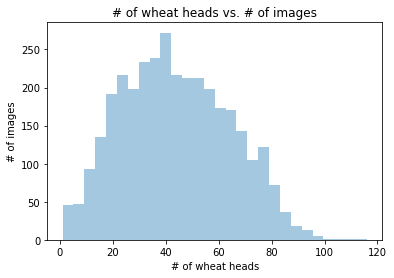

In [12]:
sns.distplot(train_df['image_id'].value_counts(), kde=False)
plt.xlabel('# of wheat heads')
plt.ylabel('# of images')
plt.title('# of wheat heads vs. # of images')
plt.show()

In [13]:
train_df[['x_min','y_min', 'width', 'height']] = pd.DataFrame([ast.literal_eval(x) for x in train_df.bbox.tolist()], index= train_df.index)
train_df = train_df[['image_id', 'bbox', 'source', 'x_min', 'y_min', 'width', 'height']]
train_df

,image_id,bbox,source,x_min,y_min,width,height
0,b6ab77fd7,"[834.0, 222.0, 56.0, 36.0]",usask_1,834.0,222.0,56.0,36.0
1,b6ab77fd7,"[226.0, 548.0, 130.0, 58.0]",usask_1,226.0,548.0,130.0,58.0
2,b6ab77fd7,"[377.0, 504.0, 74.0, 160.0]",usask_1,377.0,504.0,74.0,160.0
3,b6ab77fd7,"[834.0, 95.0, 109.0, 107.0]",usask_1,834.0,95.0,109.0,107.0
4,b6ab77fd7,"[26.0, 144.0, 124.0, 117.0]",usask_1,26.0,144.0,124.0,117.0
...,...,...,...,...,...,...,...
147788,5e0747034,"[64.0, 619.0, 84.0, 95.0]",arvalis_2,64.0,619.0,84.0,95.0
147789,5e0747034,"[292.0, 549.0, 107.0, 82.0]",arvalis_2,292.0,549.0,107.0,82.0
147790,5e0747034,"[134.0, 228.0, 141.0, 71.0]",arvalis_2,134.0,228.0,141.0,71.0
147791,5e0747034,"[430.0, 13.0, 184.0, 79.0]",arvalis_2,430.0,13.0,184.0,79.0


## Distribution of size of bounding boxes

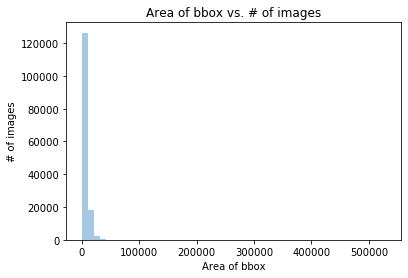

In [14]:
sns.distplot(train_df['width'] * train_df['height'], kde=False)
plt.xlabel('Area of bbox')
plt.ylabel('# of images')
plt.title('Area of bbox vs. # of images')
plt.show()

## Visualizing a few training images without bounding boxes

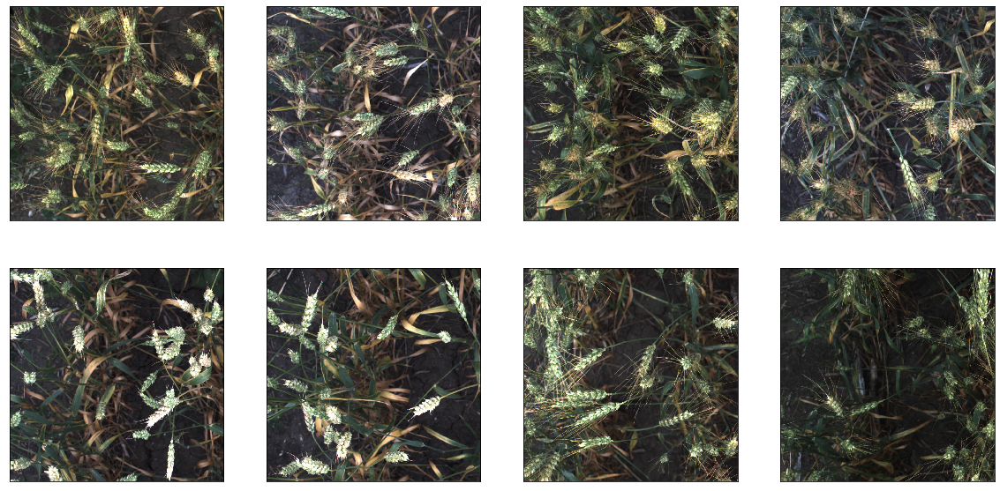

In [15]:
# Visualize few samples of current training dataset
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
count=0
for row in ax:
    for col in row:
        img = plt.imread(f'{os.path.join(BASE_DIR, "train", train_df["image_id"].unique()[count])}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        col.imshow(img)
        count += 1
plt.show()

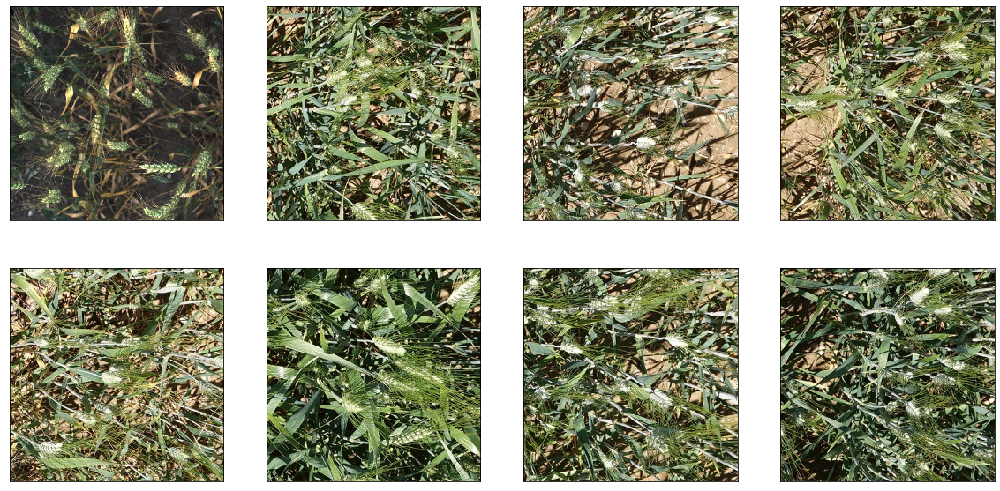

In [16]:
# Visualize few samples of current training dataset
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
count=0
for row in ax:
    for col in row:
        img = plt.imread(f'{os.path.join(BASE_DIR, "train", train_df["image_id"].unique()[-count])}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        col.imshow(img)
        count += 1
plt.show()

## Now let's visualize a few training images with bounding boxes

In [17]:
def get_bbox(image_id, df, col, color='white'):
    bboxes = df[df['image_id'] == image_id]
    
    for i in range(len(bboxes)):
        # Create a Rectangle patch
        rect = patches.Rectangle(
            (bboxes['x_min'].iloc[i], bboxes['y_min'].iloc[i]),
            bboxes['width'].iloc[i], 
            bboxes['height'].iloc[i], 
            linewidth=2, 
            edgecolor=color, 
            facecolor='none')

        # Add the patch to the Axes
        col.add_patch(rect)

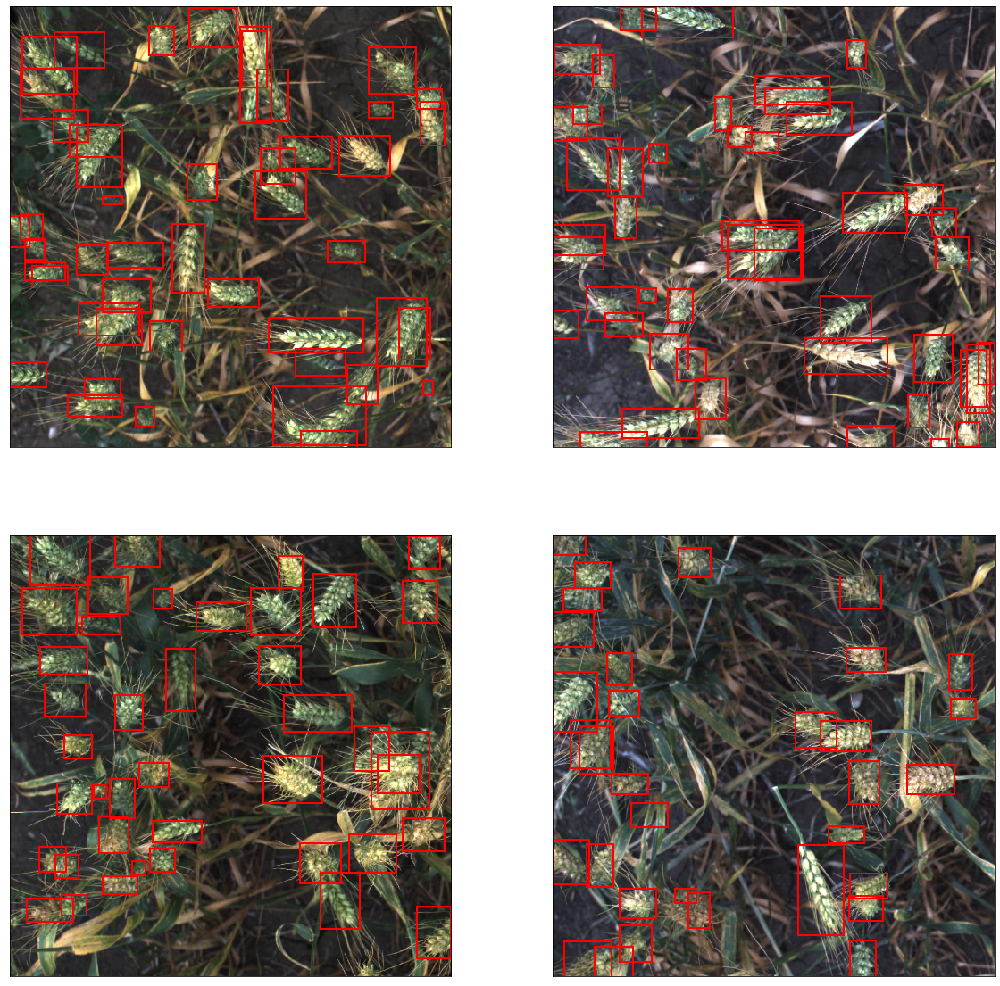

In [18]:
# Visualize few samples of current training dataset
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20, 20))
count=0
for row in ax:
    for col in row:
        img_id = train_df["image_id"].unique()[count]
        img = plt.imread(f'{os.path.join(BASE_DIR, "train", img_id)}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        get_bbox(img_id, train_df, col, color='red')
        col.imshow(img)
        count += 1
plt.show()

## few more...

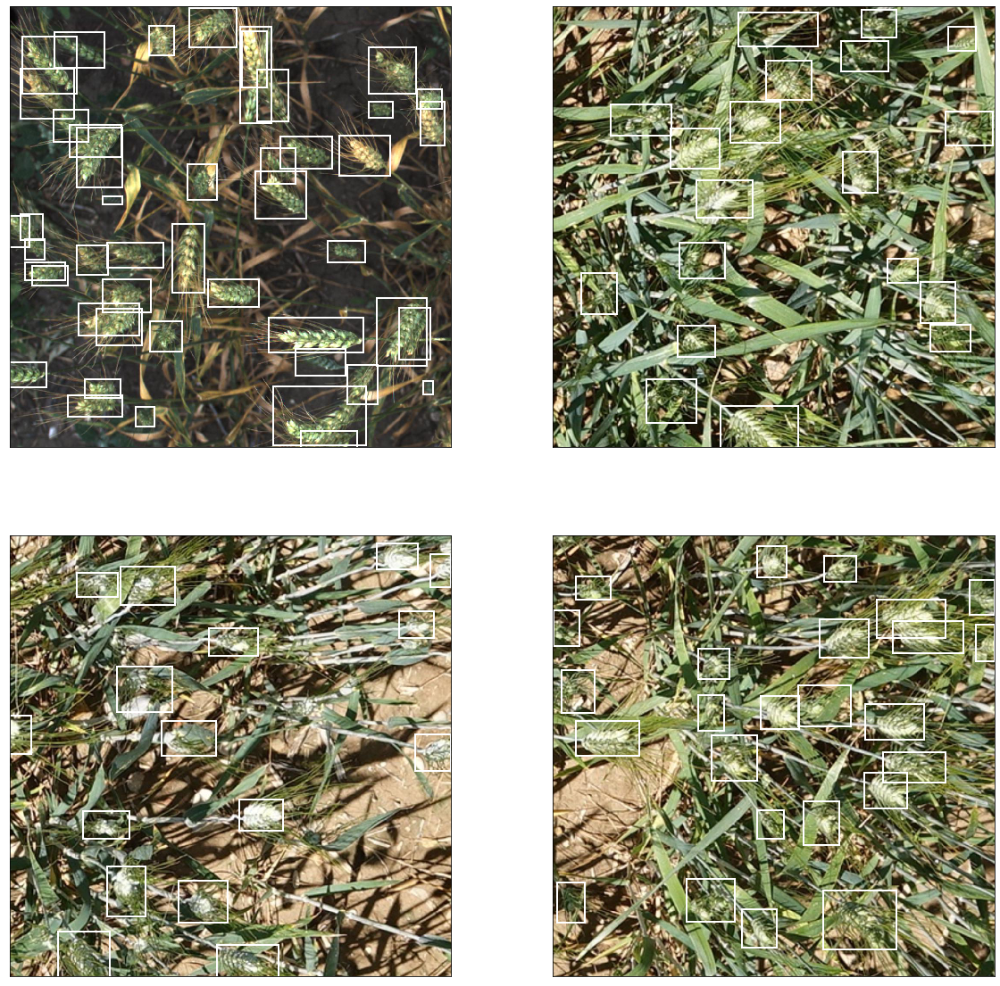

In [19]:
# Visualize few samples of current training dataset
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20, 20))
count=0
for row in ax:
    for col in row:
        img_id = train_df["image_id"].unique()[-count]
        img = plt.imread(f'{os.path.join(BASE_DIR, "train", img_id)}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        get_bbox(img_id, train_df, col)
        col.imshow(img)
        count += 1
plt.show()

## Image with highest number of wheat heads

[]

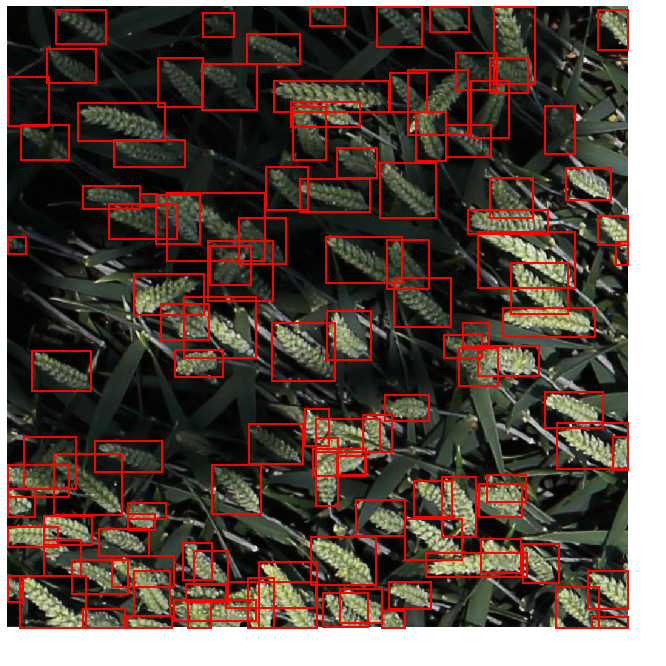

In [20]:
image_id = (train_df['image_id'].value_counts() == 116).index[0]
img = plt.imread(f'{os.path.join(BASE_DIR, "train", image_id)}.jpg')

fig, ax = plt.subplots(1, figsize=(12, 12))

ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')
get_bbox(image_id, train_df, ax, color='red')
ax.imshow(img)
plt.plot()

## Some of the images without any wheat head

In [21]:
all_images = os.listdir(os.path.join(BASE_DIR, 'train'))
all_images = set([x[:-4] for x in all_images])

images_with_bbox = set(list(train_df['image_id']))

images_without_bbox = list(all_images - images_with_bbox)

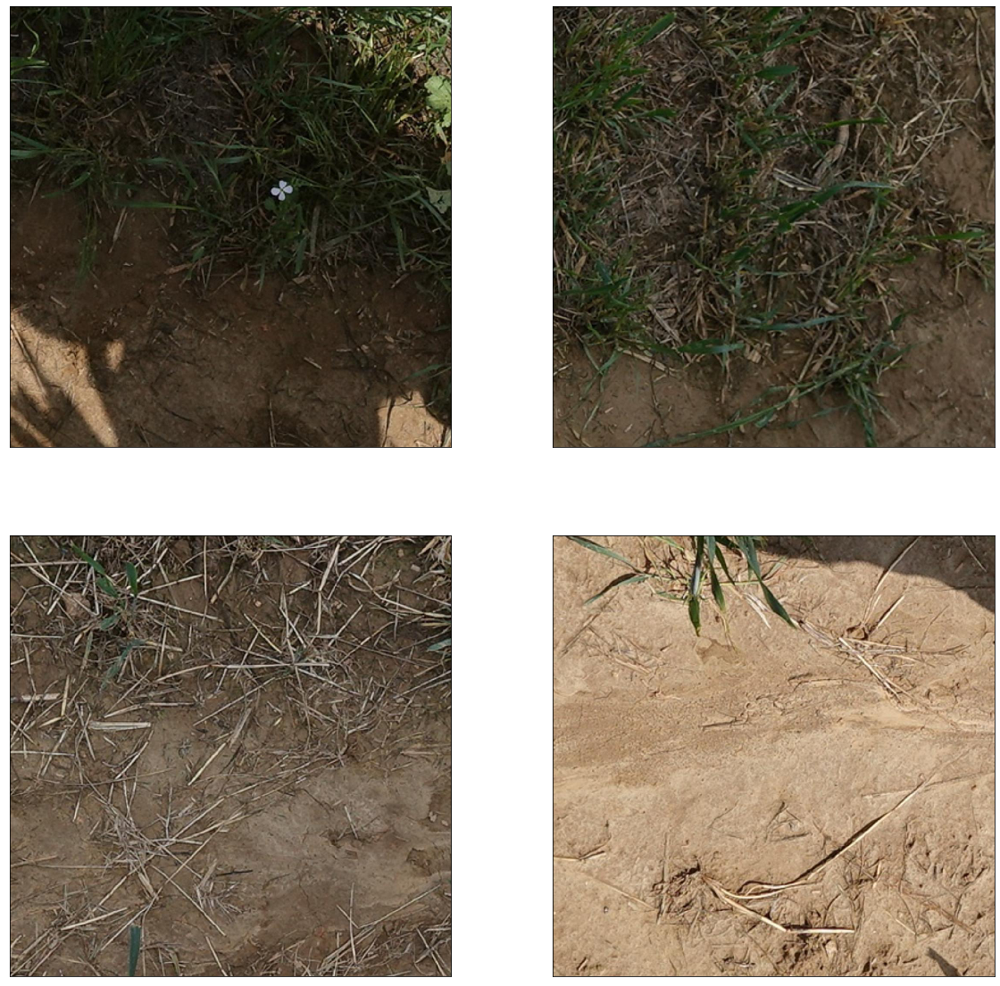

In [22]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20, 20))
count=0
for row in ax:
    for col in row:
        img_id = images_without_bbox[count]
        img = plt.imread(f'{os.path.join(BASE_DIR, "train", img_id)}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        col.imshow(img)
        count += 1
plt.show()